# Food Detection Project

This notebook implements a food detection system using CNN models. The steps include:
1. Importing the data
2. Mapping images to classes
3. Creating annotations for training and testing
4. Displaying images with bounding boxes
5. Building and training CNN models for classification


In [1]:
# Import necessary libraries
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from PIL import Image
import cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator


/Users/vishalkumar/PycharmProjects/CapstoneFoodDetection/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


## Step 1: Import the Data

First, we'll import the data and create two dataframes:
1. A dataframe mapping imageID to image data & food type
2. A dataframe mapping imageID to bounding box data from annotations


In [2]:
# Define paths
data_dir = 'data/Food_101'
annotations_dir = 'data/annotations'

# Get all food categories
food_categories = [d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))]
print(f"Found {len(food_categories)} food categories: {food_categories}")


Found 17 food categories: ['ice_cream', 'samosa', 'donuts', 'waffles', 'falafel', 'ravioli', 'strawberry_shortcake', 'spring_rolls', 'hot_dog', 'apple_pie', 'chocolate_cake', 'tacos', 'pancakes', 'pizza', 'nachos', 'french_fries', 'onion_rings']


In [3]:
# Create a dataframe mapping imageID to image data & food type
image_data = []

for category in tqdm(food_categories, desc="Processing food categories"):
    category_dir = os.path.join(data_dir, category)
    image_files = glob.glob(os.path.join(category_dir, "*.jpg"))

    for img_path in image_files:
        img_filename = os.path.basename(img_path)
        img_id = os.path.splitext(img_filename)[0]  # Remove extension to get ID

        image_data.append({
            'image_id': img_id,
            'image_path': img_path,
            'food_type': category
        })

# Create the dataframe
image_df = pd.DataFrame(image_data)
print(f"Created image dataframe with {len(image_df)} entries")
image_df.head()


Processing food categories: 100%|██████████| 17/17 [00:00<00:00, 261.27it/s]

Created image dataframe with 16256 entries


,image_id,image_path,food_type
0,1795168,data/Food_101/ice_cream/1795168.jpg,ice_cream
1,3730391,data/Food_101/ice_cream/3730391.jpg,ice_cream
2,1052863,data/Food_101/ice_cream/1052863.jpg,ice_cream
3,2557070,data/Food_101/ice_cream/2557070.jpg,ice_cream
4,2217633,data/Food_101/ice_cream/2217633.jpg,ice_cream


In [4]:
# Function to parse XML annotation file
def parse_annotation(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    # Get image ID from filename
    filename = root.find('filename').text
    image_id = os.path.splitext(filename)[0]

    # Get image dimensions
    size = root.find('size')
    width = int(size.find('width').text)
    height = int(size.find('height').text)

    # Get all objects (bounding boxes)
    boxes = []
    for obj in root.findall('object'):
        name = obj.find('name').text
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)

        boxes.append({
            'image_id': image_id,
            'class': name,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax,
            'width': width,
            'height': height
        })

    return boxes


In [5]:
# Create a dataframe mapping imageID to bounding box data from annotations
annotation_data = []

# Get all annotation files
annotation_files = glob.glob(os.path.join(annotations_dir, "*.xml"))
print(f"Found {len(annotation_files)} annotation files")

# Parse each annotation file
for xml_path in tqdm(annotation_files, desc="Parsing annotation files"):
    boxes = parse_annotation(xml_path)
    annotation_data.extend(boxes)

# Create the dataframe
annotation_df = pd.DataFrame(annotation_data)
print(f"Created annotation dataframe with {len(annotation_df)} entries")
annotation_df.head()


Found 500 annotation files


Parsing annotation files: 100%|██████████| 500/500 [00:00<00:00, 5746.54it/s]

Created annotation dataframe with 553 entries


,image_id,class,xmin,ymin,xmax,ymax,width,height
0,209662,nachos,65,80,430,289,512,382
1,172042,french_fries,102,164,512,389,512,512
2,248212,nachos,13,36,382,468,382,512
3,524839,onion_rings,71,11,427,463,512,512
4,74527,onion_rings,210,10,455,272,512,383


## Step 2: Map Training and Testing Images to Classes

Now we'll split the data into training and testing sets with a 70:30 ratio, ensuring that the same IDs are in corresponding train/test sets for both dataframes.


In [6]:
# Get unique image IDs that have annotations
annotated_image_ids = annotation_df['image_id'].unique()
print(f"Found {len(annotated_image_ids)} unique images with annotations")

# Get all unique image IDs
all_image_ids = image_df['image_id'].unique()
print(f"Found {len(all_image_ids)} total unique images")

# Create a mapping of image_id to food_type for stratified splitting
image_id_to_food_type = dict(zip(image_df['image_id'], image_df['food_type']))

# Create a DataFrame for annotated images with their food types for stratified splitting
annotated_df = pd.DataFrame({
    'image_id': annotated_image_ids,
    'food_type': [image_id_to_food_type[img_id] for img_id in annotated_image_ids]
})

# Split the annotated images into training and testing sets (70:30 ratio) with stratification by food type
train_annotated_df, test_annotated_df = train_test_split(
    annotated_df,
    test_size=0.3,
    random_state=42,
    stratify=annotated_df['food_type']  # Stratify by food type
)

# Extract the image IDs
train_annotated_ids = train_annotated_df['image_id'].values
test_annotated_ids = test_annotated_df['image_id'].values

print(f"Training set (annotated): {len(train_annotated_ids)} images")
print(f"Testing set (annotated): {len(test_annotated_ids)} images")

# Get non-annotated image IDs
non_annotated_ids = np.setdiff1d(all_image_ids, annotated_image_ids)
print(f"Non-annotated images: {len(non_annotated_ids)} images")

# Create a DataFrame for non-annotated images with their food types for stratified splitting
non_annotated_df = pd.DataFrame({
    'image_id': non_annotated_ids,
    'food_type': [image_id_to_food_type[img_id] for img_id in non_annotated_ids]
})

# Split non-annotated images into train and test with the same ratio, stratified by food type
train_non_annotated_df, test_non_annotated_df = train_test_split(
    non_annotated_df,
    test_size=0.3,
    random_state=42,
    stratify=non_annotated_df['food_type']  # Stratify by food type
)

# Extract the image IDs
train_non_annotated_ids = train_non_annotated_df['image_id'].values
test_non_annotated_ids = test_non_annotated_df['image_id'].values

# Combine annotated and non-annotated IDs for final train/test sets
train_ids = np.concatenate([train_annotated_ids, train_non_annotated_ids])
test_ids = np.concatenate([test_annotated_ids, test_non_annotated_ids])

print(f"Final training set: {len(train_ids)} images")
print(f"Final testing set: {len(test_ids)} images")


Found 500 unique images with annotations
Found 16256 total unique images
Training set (annotated): 350 images
Testing set (annotated): 150 images
Non-annotated images: 15756 images
Final training set: 11379 images
Final testing set: 4877 images


In [7]:
# Create training and testing dataframes for images (using all images)
train_image_df = image_df[image_df['image_id'].isin(train_ids)]
test_image_df = image_df[image_df['image_id'].isin(test_ids)]

# Create training and testing dataframes for annotations (only for annotated images)
train_annotation_df = annotation_df[annotation_df['image_id'].isin(train_annotated_ids)]
test_annotation_df = annotation_df[annotation_df['image_id'].isin(test_annotated_ids)]

print(f"Training image dataframe: {len(train_image_df)} entries")
print(f"Testing image dataframe: {len(test_image_df)} entries")
print(f"Training annotation dataframe: {len(train_annotation_df)} entries")
print(f"Testing annotation dataframe: {len(test_annotation_df)} entries")

# Verify that the stratification is working correctly
print("\nVerifying stratification by food category:")
train_food_counts = train_image_df['food_type'].value_counts(normalize=True)
test_food_counts = test_image_df['food_type'].value_counts(normalize=True)

# Display the distribution of food types in training and testing sets
print("\nTraining set food type distribution (%):")
print(train_food_counts * 100)
print("\nTesting set food type distribution (%):")
print(test_food_counts * 100)

# Calculate the difference in distribution
print("\nDifference in distribution (percentage points):")
food_types = set(train_food_counts.index) | set(test_food_counts.index)
for food_type in food_types:
    train_pct = train_food_counts.get(food_type, 0) * 100
    test_pct = test_food_counts.get(food_type, 0) * 100
    diff = abs(train_pct - test_pct)
    print(f"{food_type}: {diff:.2f}pp")


Training image dataframe: 11379 entries
Testing image dataframe: 4877 entries
Training annotation dataframe: 389 entries
Testing annotation dataframe: 164 entries

Verifying stratification by food category:

Training set food type distribution (%):
food_type
ice_cream               6.151683
samosa                  6.151683
french_fries            6.151683
nachos                  6.151683
pizza                   6.151683
pancakes                6.151683
tacos                   6.151683
chocolate_cake          6.151683
hot_dog                 6.151683
spring_rolls            6.151683
strawberry_shortcake    6.151683
ravioli                 6.151683
falafel                 6.151683
waffles                 6.151683
donuts                  6.151683
onion_rings             6.151683
apple_pie               1.573073
Name: proportion, dtype: float64

Testing set food type distribution (%):
food_type
ice_cream               6.151323
samosa                  6.151323
french_fries            6.1513

## Step 3: Create Annotations for Training and Testing Images

The annotations have already been created and loaded into our dataframes. Let's examine the distribution of classes in our annotations.


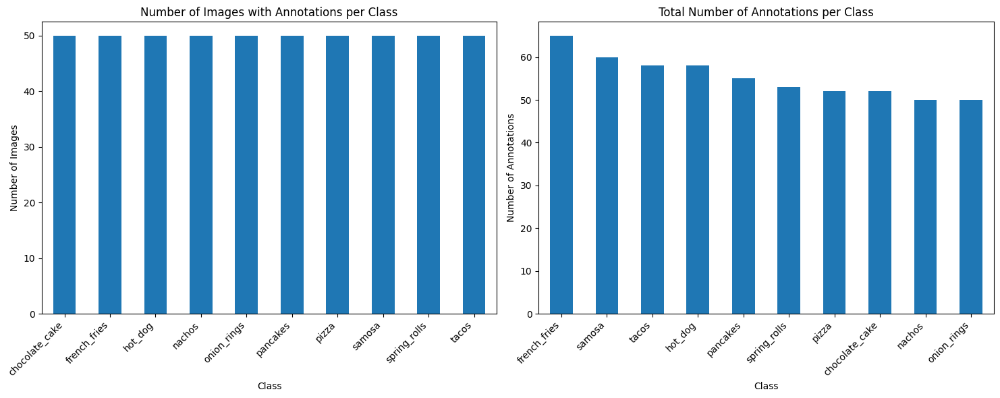

In [8]:
# Count the number of images with annotations per class
images_with_annotations = annotation_df.groupby('class')['image_id'].nunique()

# Count total number of annotations per class
annotations_per_class = annotation_df['class'].value_counts()

# Create subplots
plt.figure(figsize=(15, 6))

# Plot 1: Images with annotations per class
plt.subplot(1, 2, 1)
images_with_annotations.plot(kind='bar')
plt.title('Number of Images with Annotations per Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45, ha='right')

# Plot 2: Total annotations per class  
plt.subplot(1, 2, 2)
annotations_per_class.plot(kind='bar')
plt.title('Total Number of Annotations per Class')
plt.xlabel('Class')
plt.ylabel('Number of Annotations')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## Step 4: Display Images with Bounding Boxes

Now let's display some images with their bounding boxes to verify our data.


In [9]:
# Function to display an image with its bounding boxes
def display_image_with_boxes(image_id, image_df, annotation_df):
    # Get image path
    image_row = image_df[image_df['image_id'] == image_id].iloc[0]
    image_path = image_row['image_path']
    food_type = image_row['food_type']

    # Get annotations for this image
    boxes = annotation_df[annotation_df['image_id'] == image_id]

    # Load and display the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

    plt.figure(figsize=(10, 8))
    plt.imshow(img)

    # Draw bounding boxes
    for _, box in boxes.iterrows():
        xmin, ymin, xmax, ymax = box['xmin'], box['ymin'], box['xmax'], box['ymax']
        class_name = box['class']

        # Create rectangle
        rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, 
                            fill=False, edgecolor='red', linewidth=2)
        plt.gca().add_patch(rect)

        # Add label
        plt.text(xmin, ymin - 5, class_name, 
                 bbox=dict(facecolor='red', alpha=0.5), fontsize=12, color='white')

    plt.title(f"Image ID: {image_id}, Food Type: {food_type}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()


Images with annotations:


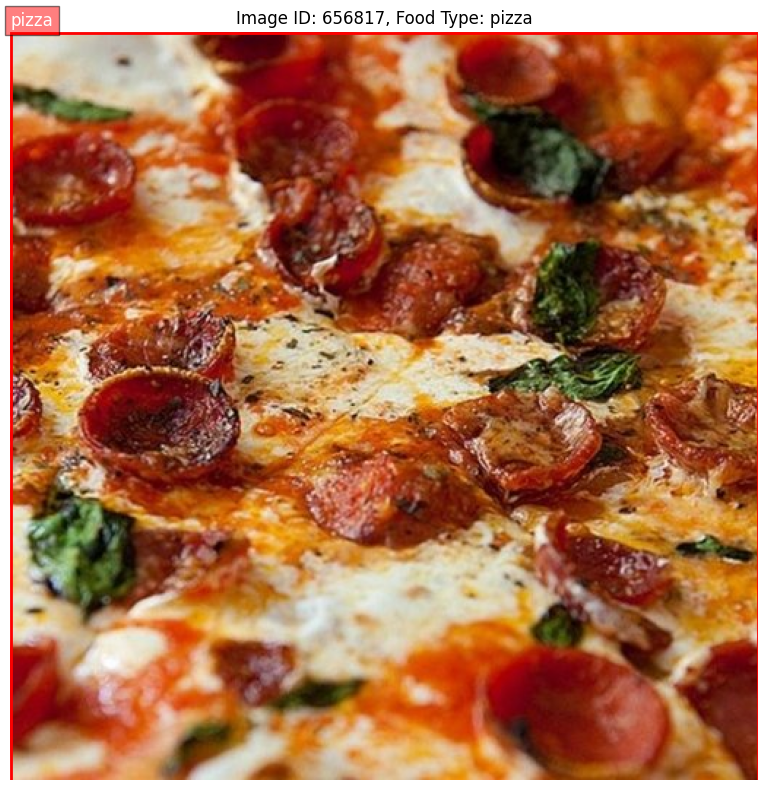

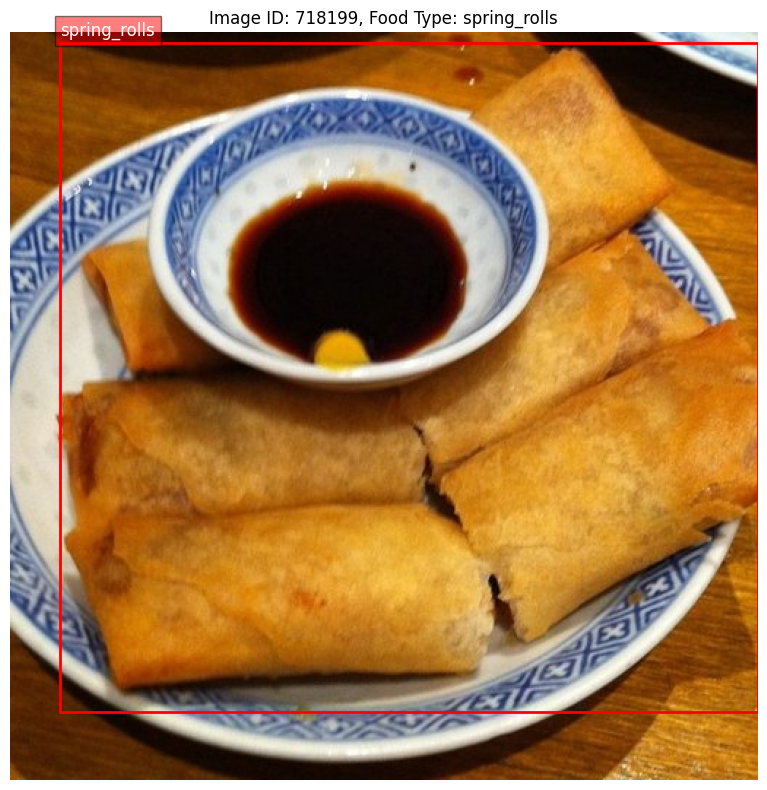

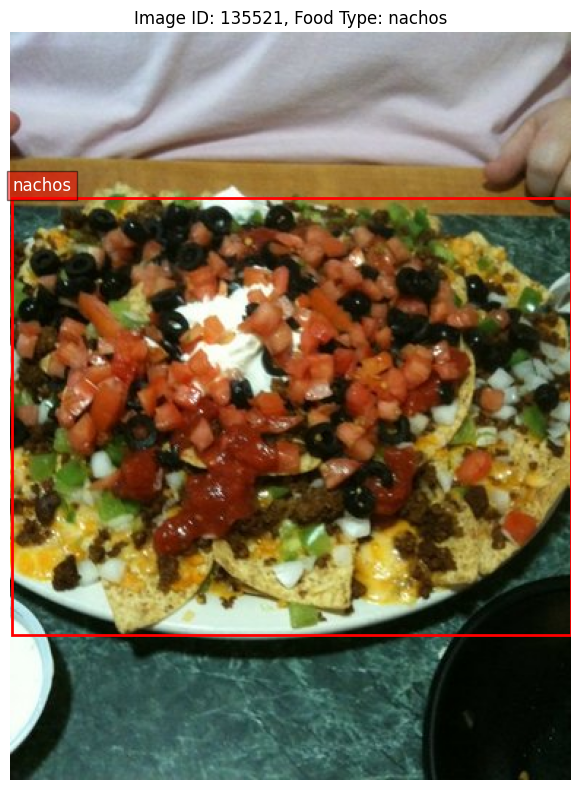

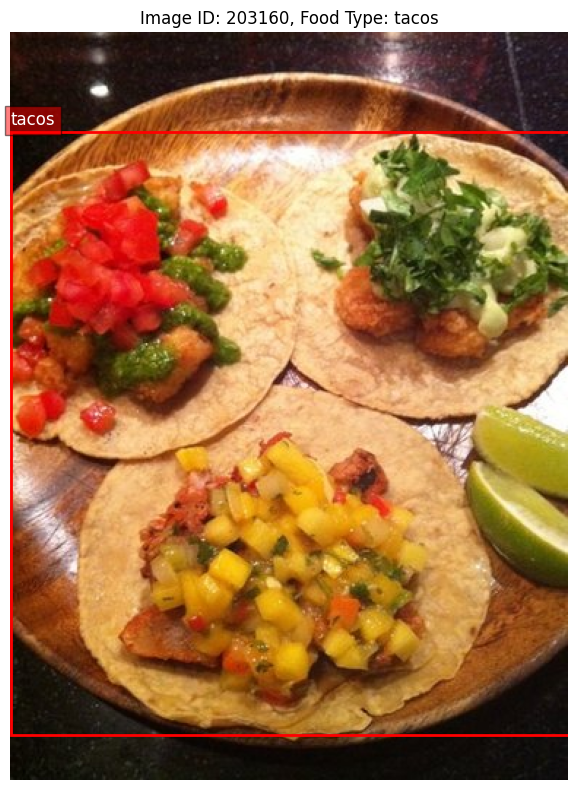


Images without annotations:


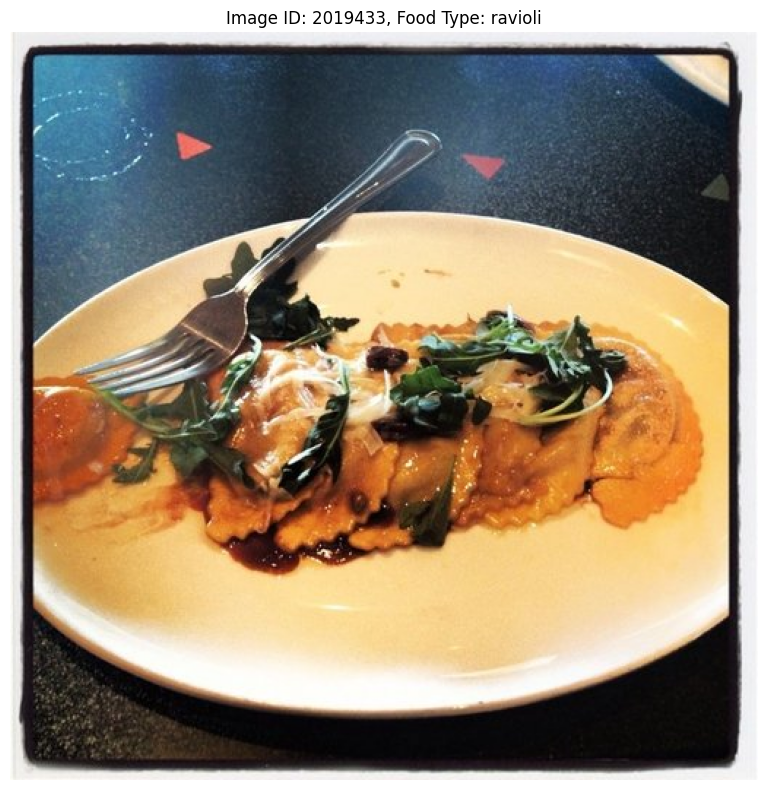

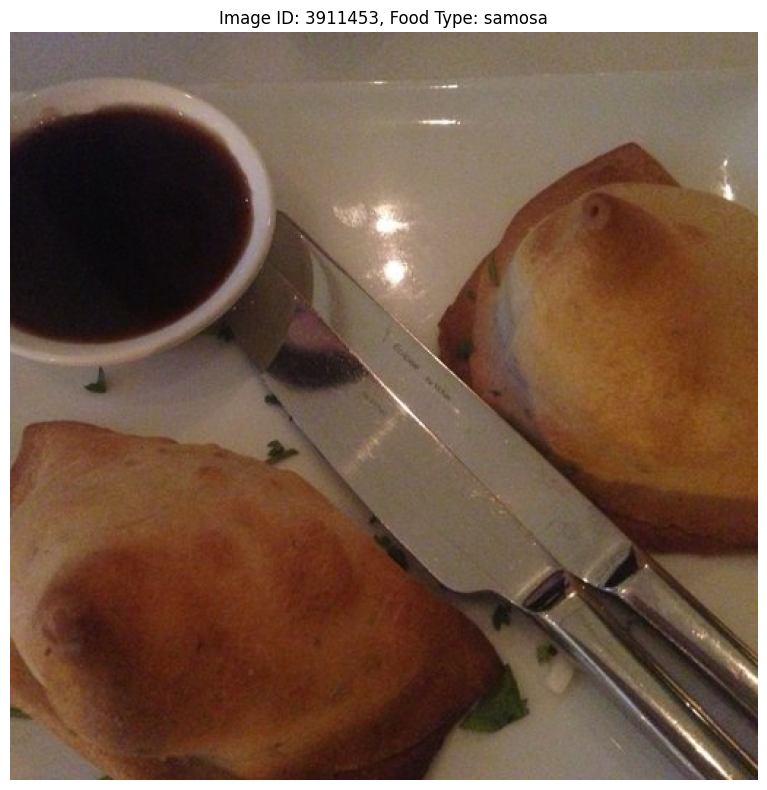

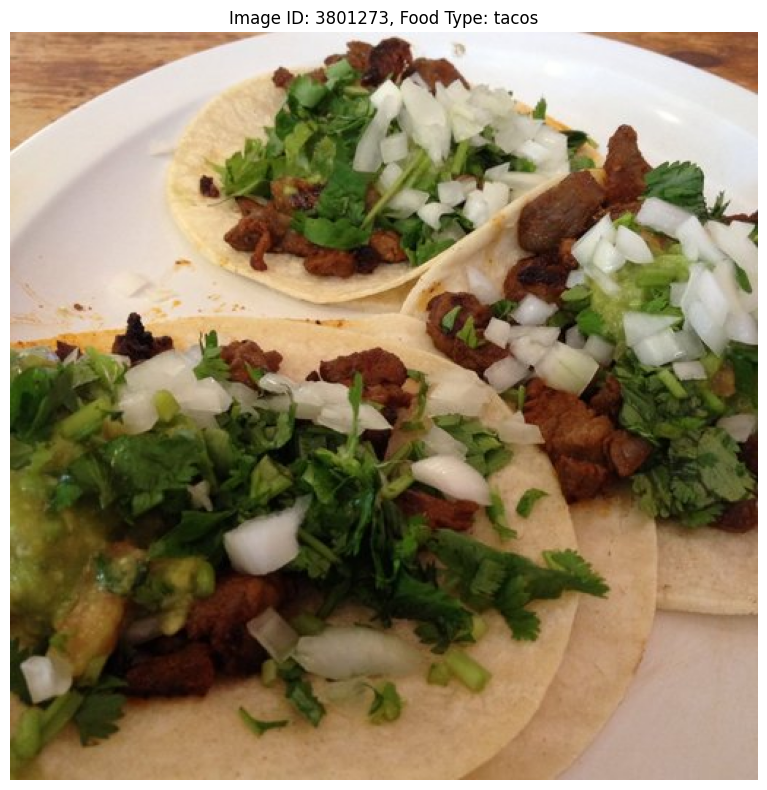

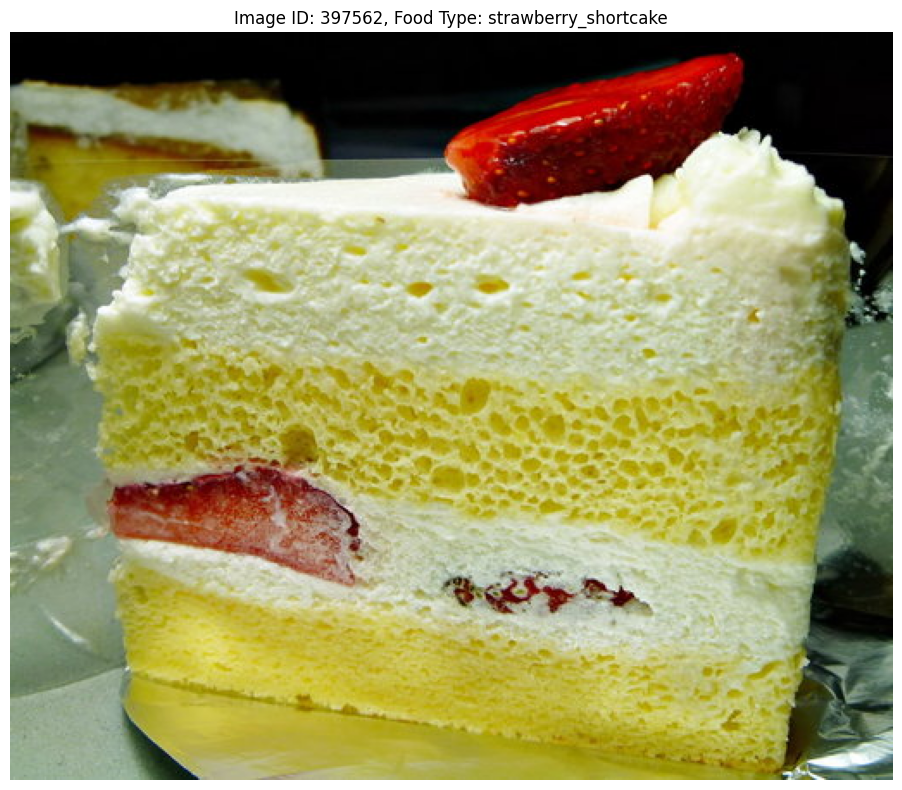

In [10]:
# Get a mix of annotated and non-annotated image IDs
annotated_sample = np.random.choice(annotated_image_ids, size=4, replace=False)
non_annotated_sample = np.random.choice(non_annotated_ids, size=4, replace=False)

# Display annotated images
print("Images with annotations:")
for img_id in annotated_sample:
    display_image_with_boxes(img_id, image_df, annotation_df)

# Display non-annotated images
print("\nImages without annotations:")
for img_id in non_annotated_sample:
    display_image_with_boxes(img_id, image_df, annotation_df)


In [11]:
train_image_df.head()

,image_id,image_path,food_type
1,3730391,data/Food_101/ice_cream/3730391.jpg,ice_cream
2,1052863,data/Food_101/ice_cream/1052863.jpg,ice_cream
3,2557070,data/Food_101/ice_cream/2557070.jpg,ice_cream
4,2217633,data/Food_101/ice_cream/2217633.jpg,ice_cream
6,258424,data/Food_101/ice_cream/258424.jpg,ice_cream


In [12]:
test_image_df.head()


,image_id,image_path,food_type
0,1795168,data/Food_101/ice_cream/1795168.jpg,ice_cream
5,2494775,data/Food_101/ice_cream/2494775.jpg,ice_cream
8,3009207,data/Food_101/ice_cream/3009207.jpg,ice_cream
17,1223415,data/Food_101/ice_cream/1223415.jpg,ice_cream
21,85514,data/Food_101/ice_cream/85514.jpg,ice_cream


## Step 5: Build and Train a Basic CNN Model for Food Type Detection

Now we'll build a basic CNN model to detect food types using the training and test image dataframes.


In [13]:
# Define constants
IMG_SIZE = 224  # Standard size for many CNN models
BATCH_SIZE = 32
EPOCHS = 10
NUM_CLASSES = len(food_categories)

# Create a mapping of food types to numerical labels
food_type_to_label = {food_type: i for i, food_type in enumerate(food_categories)}
label_to_food_type = {i: food_type for food_type, i in food_type_to_label.items()}

# Add numerical labels to the dataframes
train_image_df['label'] = train_image_df['food_type'].map(food_type_to_label)
test_image_df['label'] = test_image_df['food_type'].map(food_type_to_label)


/var/folders/qr/k1_32qy12p3cq7f9nm4yjzqr0000gp/T/ipykernel_4888/1245273598.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_image_df['label'] = train_image_df['food_type'].map(food_type_to_label)
/var/folders/qr/k1_32qy12p3cq7f9nm4yjzqr0000gp/T/ipykernel_4888/1245273598.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_image_df['label'] = test_image_df['food_type'].map(food_type_to_label)


In [14]:
# Function to preprocess images
def preprocess_image(image_path, label):
    # Read the image file
    image = tf.io.read_file(image_path)
    # Decode the image
    image = tf.image.decode_jpeg(image, channels=3)
    # Resize the image
    image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
    # Normalize the pixel values
    image = image / 255.0
    return image, label


In [15]:
# Create TensorFlow datasets
train_ds = tf.data.Dataset.from_tensor_slices((
    train_image_df['image_path'].values,
    train_image_df['label'].values
))
train_ds = train_ds.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.shuffle(buffer_size=len(train_image_df))
train_ds = train_ds.batch(BATCH_SIZE)
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

test_ds = tf.data.Dataset.from_tensor_slices((
    test_image_df['image_path'].values,
    test_image_df['label'].values
))
test_ds = test_ds.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_ds.batch(BATCH_SIZE)
test_ds = test_ds.prefetch(tf.data.AUTOTUNE)

# Split training data into training and validation sets
train_size = int(0.8 * len(train_image_df))
val_size = len(train_image_df) - train_size

train_ds_final = train_ds.take(train_size // BATCH_SIZE)
val_ds = train_ds.skip(train_size // BATCH_SIZE)

print(f"Training batches: {tf.data.experimental.cardinality(train_ds_final)}")
print(f"Validation batches: {tf.data.experimental.cardinality(val_ds)}")
print(f"Test batches: {tf.data.experimental.cardinality(test_ds)}")


Training batches: 284
Validation batches: 72
Test batches: 153


2025-07-13 10:00:45.976061: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


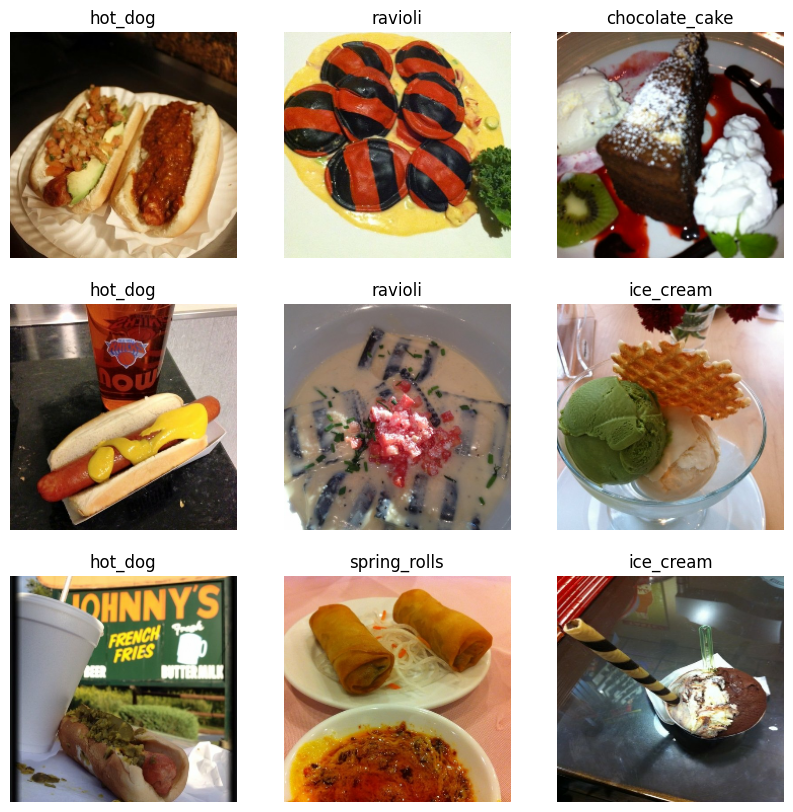

In [16]:
# Display a few sample images from the training dataset
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(min(9, len(images))):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        plt.title(label_to_food_type[labels[i].numpy()])
        plt.axis("off")


In [17]:
# Build a basic CNN model
def build_cnn_model():
    model = models.Sequential([
        # First convolutional block
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
        layers.MaxPooling2D((2, 2)),

        # Second convolutional block
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        # Third convolutional block
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        # Flatten and dense layers
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.5),  # Add dropout to prevent overfitting
        layers.Dense(NUM_CLASSES, activation='softmax')  # Output layer with softmax activation
    ])

    # Compile the model
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

# Create the model
model = build_cnn_model()
model.summary()


/Users/vishalkumar/PycharmProjects/CapstoneFoodDetection/.venv/lib/python3.9/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 17)             │         2,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,171,153 (42.61 MB)

 Trainable params: 11,171,153 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

In [18]:
# Train the model
history = model.fit(
    train_ds_final,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=3,
            restore_best_weights=True
        )
    ]
)


Epoch 1/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 77s 264ms/step - accuracy: 0.0648 - loss: 3.0056 - val_accuracy: 0.0877 - val_loss: 2.8121
Epoch 2/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 75s 256ms/step - accuracy: 0.0965 - loss: 2.7806 - val_accuracy: 0.1650 - val_loss: 2.6382
Epoch 3/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 76s 262ms/step - accuracy: 0.1622 - loss: 2.6328 - val_accuracy: 0.2693 - val_loss: 2.4558
Epoch 4/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 77s 266ms/step - accuracy: 0.2380 - loss: 2.4372 - val_accuracy: 0.4273 - val_loss: 2.1172
Epoch 5/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 78s 267ms/step - accuracy: 0.3403 - loss: 2.1309 - val_accuracy: 0.5574 - val_loss: 1.6325
Epoch 6/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 78s 269ms/step - accuracy: 0.4359 - loss: 1.8193 - val_accuracy: 0.7145 - val_loss: 1.1746
Epoch 7/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 79s 272ms/step - accuracy: 0.5397 - loss: 1.4793 - val_accuracy: 0.8158 - val_loss: 0.7691
Epoch 8/10
284/284 ━━━━━━━━━━━━━━━━━━━━ 79s 273ms/step - accuracy: 0.6420 - loss: 1

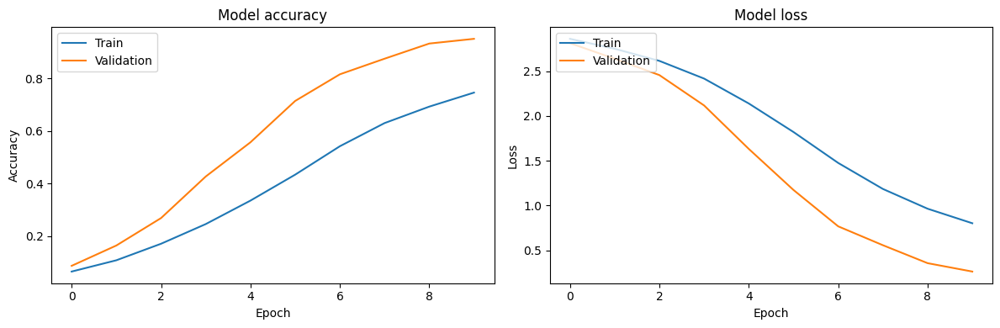

In [19]:
# Plot training history
plt.figure(figsize=(12, 4))

# Plot training & validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


In [20]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_ds)
print(f"Test accuracy: {test_accuracy:.4f}")
print(f"Test loss: {test_loss:.4f}")


153/153 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.2006 - loss: 3.4071
Test accuracy: 0.2303
Test loss: 3.2794


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


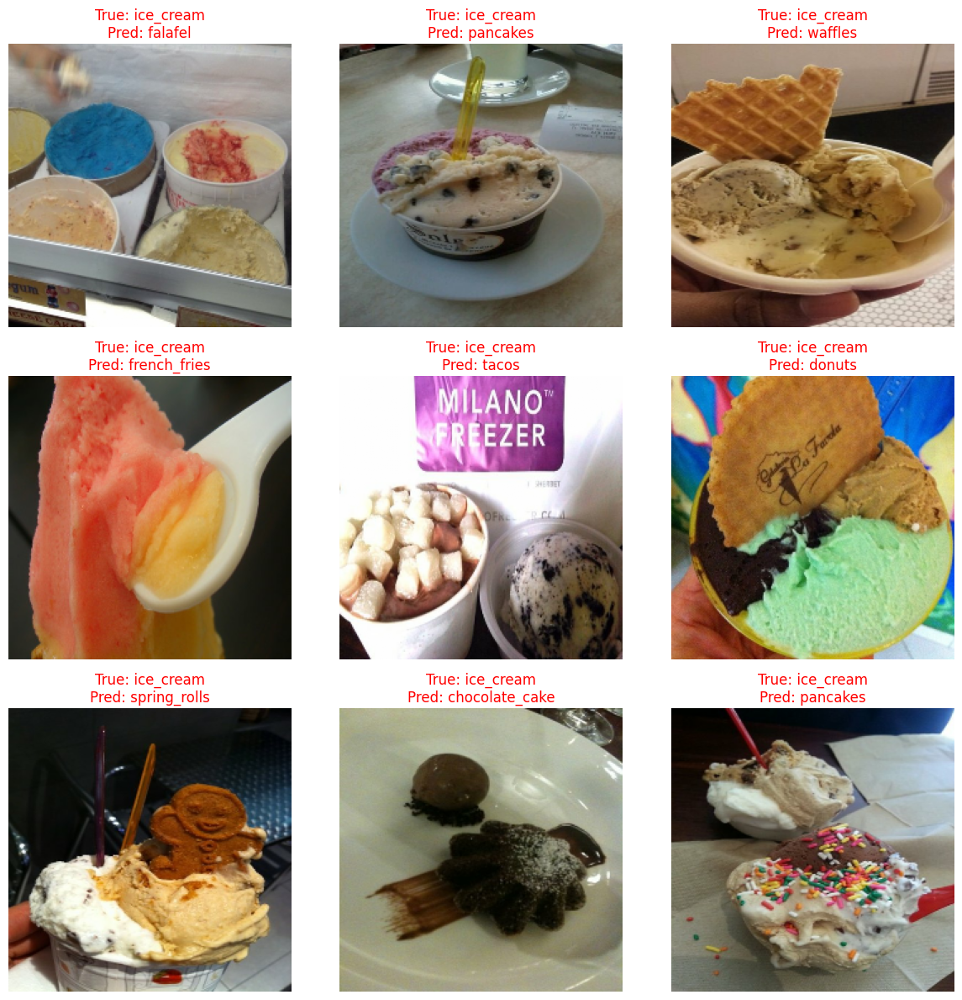

2025-07-13 10:13:56.277096: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [21]:
# Make predictions on a few test images
for images, labels in test_ds.take(1):
    predictions = model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)

    plt.figure(figsize=(12, 12))
    for i in range(min(9, len(images))):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        true_label = label_to_food_type[labels[i].numpy()]
        predicted_label = label_to_food_type[predicted_classes[i]]

        title_color = 'green' if true_label == predicted_label else 'red'
        plt.title(f"True: {true_label}\nPred: {predicted_label}", color=title_color)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━

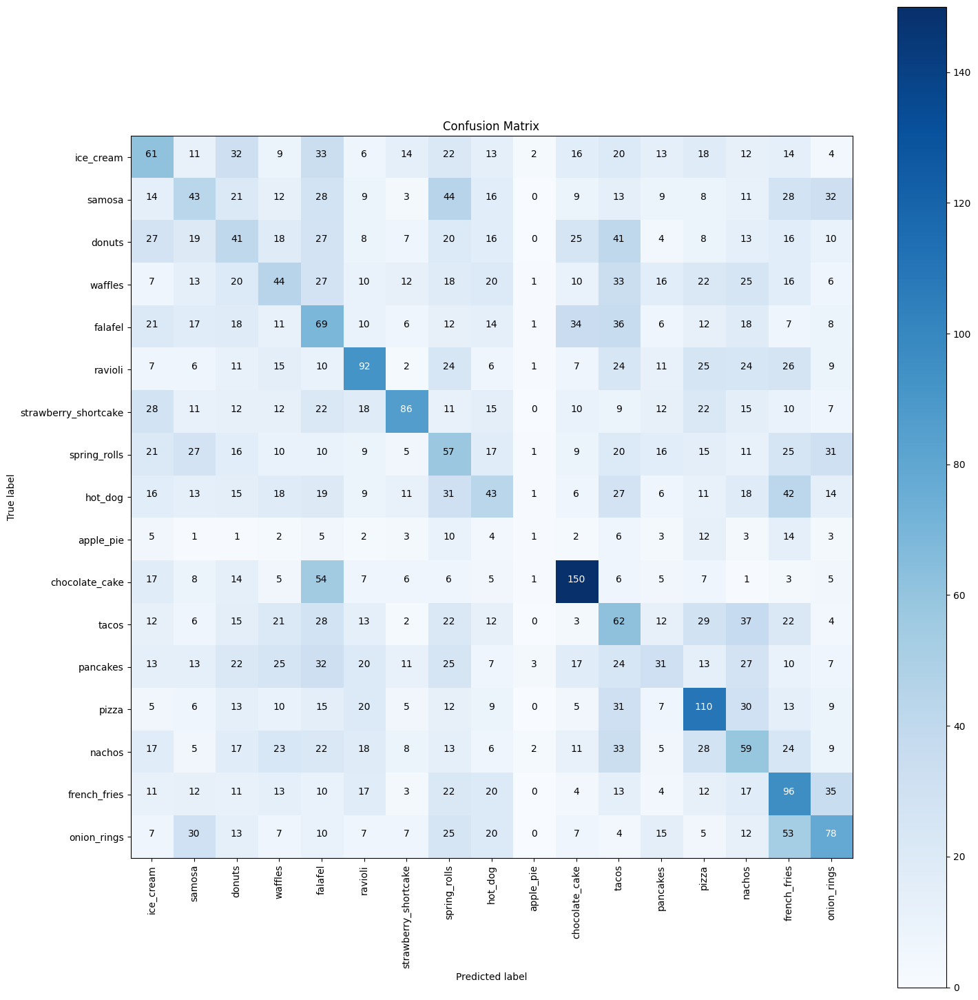

Classification Report:
                      precision    recall  f1-score   support

           ice_cream       0.21      0.20      0.21       300
              samosa       0.18      0.14      0.16       300
              donuts       0.14      0.14      0.14       300
             waffles       0.17      0.15      0.16       300
             falafel       0.16      0.23      0.19       300
             ravioli       0.33      0.31      0.32       300
strawberry_shortcake       0.45      0.29      0.35       300
        spring_rolls       0.15      0.19      0.17       300
             hot_dog       0.18      0.14      0.16       300
           apple_pie       0.07      0.01      0.02        77
      chocolate_cake       0.46      0.50      0.48       300
               tacos       0.15      0.21      0.18       300
            pancakes       0.18      0.10      0.13       300
               pizza       0.31      0.37      0.33       300
              nachos       0.18      0.20     

In [22]:
# Create a confusion matrix to visualize the model's performance
from sklearn.metrics import confusion_matrix, classification_report

# Get predictions for all test images
all_labels = []
all_predictions = []

for images, labels in test_ds:
    predictions = model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)

    all_labels.extend(labels.numpy())
    all_predictions.extend(predicted_classes)

# Create and plot the confusion matrix
cm = confusion_matrix(all_labels, all_predictions)
plt.figure(figsize=(15, 15))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

# Add class labels
tick_marks = np.arange(len(food_categories))
plt.xticks(tick_marks, food_categories, rotation=90)
plt.yticks(tick_marks, food_categories)

# Add count labels to the plot
thresh = cm.max() / 2
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

# Print classification report
print("Classification Report:")
print(classification_report(
    all_labels, 
    all_predictions, 
    target_names=food_categories
))
